## Högberg lab NGS sequence analysis notebook - version 0.1 BETA
### setup / installation

- install miniconda and create a new python 3 environment:
    - conda create -n NGS_analysis python=3.7
    - conda info --envs
    - conda activate NGS_analysis
    - conda deactivate NGS_analysis
    
- set up your python 3 miniconda environment with the following modules:
        (e.g. install with: conda install numpy=1.18.1)
    - numpy 1.18.1
    - scipy 1.4.1
    - Bio 1.76
    - sklearn 0.22.1
    - bokeh 2.0.1
    - matplotlib 3.1.3
    - panel 0.9.5
    - Levenshtein
        conda install -c conda-forge python-levenshtein
    
- *** before running, verify that you have the Muscle binary file (either muscle.exe for windows of muscle for linux) and set the path in the parameters cell near the top of this notebook ***
     - https://www.drive5.com/muscle/downloads.htm

### install muscle
https://www.drive5.com/muscle/manual/install.html
- download the binary file and place it wherever (/home/ian/) 
- rename the file muscle
- chmod +x /home/ian/muscle
- run with:
    /home/ian/muscle -in infilename.fsa -out outfilename.fsa
- be careful with size of the job -  200-500nt sequences x150 takes about 5 minutes

### instructions
- sq3.py
    - place this notebook file in the same folder as sq3
    - this is the backend module for the functions here
- NGS_data
    - place the all fastq data files into a folder called ngs_data and place the folder in this working directory
- reference_sequences.fsa
    - the reference sequences should contain a list of a priori sequences of interest you wish to aid the clustering of data, use fasta format
    - N.B. you DO need to include reverse complementary sequences here
- references_to_harvest.fsa
    - prepare a file of with the sequences you wish to harvest from the record
    - N.B. you DO NOT need to include reverse complementary sequences here

# contents

### 1. set basic parameters
### 2. First pass clustering
    structure data
    Principal component analysis
    Hierarchical clustering on multi-dimensional data
    Collect landmark sequences
### 3. Second pass clustering
    Restructure data with the new landmark sequences
    second pass principal component analysis
    Second pass TSNE and hierarchical clustering
### 4. Cluster analysis
    sort the clusters into files 
    characterize the consensus sequences with references using pairwise local alignment
    visualize an individual cluster's multiple sequence alignment
    (optional) mass-scale sorting 
        generate a Voronoi tessellation from the cluster centers
### 5. COARSE HARVESTING - (unrelated to clustering)
    use BLAST to quickly harvest sequences with decent agreement with references
### 6. Fine harvest - local alignment

In [1]:
import itertools
import sq3
import os
import numpy as np

import matplotlib.pyplot as plt

from tqdm import tqdm
from Bio import AlignIO
from Bio.Align import MultipleSeqAlignment
from Bio import AlignIO
from Bio import pairwise2
from Bio.SeqRecord import SeqRecord
from Bio.Align.Applications import MuscleCommandline
from Bio.Alphabet import IUPAC
from Bio.Align import AlignInfo
from Bio.pairwise2 import format_alignment
from Bio import SeqIO

from bokeh.plotting import figure
from bokeh.models import ColumnDataSource, Plot, Grid, Range1d
from bokeh.models.glyphs import Text, Rect
from bokeh.layouts import gridplot
from bokeh.io import export_svgs

import panel as pn
import panel.widgets as pnw

import importlib
importlib.reload(sq3)

from scipy.spatial.distance import euclidean

import Levenshtein

import uuid

# import sklearn
# import Bio
# import scipy
# import bokeh
# import matplotlib
# print("numpy", np.__version__)
# print("scipy", scipy.__version__)
# print("Bio", Bio.__version__)
# print("sklearn", sklearn.__version__)
# print("bokeh", bokeh.__version__)
# print("matplotlib", matplotlib.__version__)
# print("panel", pn.__version__)

# 1. Set up parameters

- change these values if necessary to adjust the output of the notebook

In [2]:
#### parameters for primary clustering ####
sample_size = 100 # number of reads to fetch from the ngs_data directory
random_dimensions = 200 # number of random sequences that will be used as landmarks
cluster_thresh = 0.25 # lower number means more clusters

### parameters for the second scaled-up round of clustering ###
dimensions = 200 #add this to number of reference sequences for total number of dimensions
sample_size2 = 1000
cluster_thresh = 0.5 # lower number means more clusters

### parameters for sorting ###
mass_sort = False
msa = True
muscle_exe = r"/home/ian/muscle"
consensus_threshold = 0.5 #threshold agreement to call a consensus position's identity
### mass harvest target sequences and their alignments ###
mass_harvest = True
blast_threshold = 0.7 # blast threshold for harvesting target sequences
high_quality_threshold = 0.75 # smith-waterman threshold for storing alignment data

# 2. First pass clustering
## structure data
- choose e.g. 200 random dimensions - random sequences that each read will be compared to with Levenshtein distance
- sample a limited e.g. 500-1000 reads for the first pass to determine better landmark dimensions for 2nd pass
- included here are also reference sequences - utilize prior knowledge of the expected distribution
    - include any sequences you expect to find
    - include negative control sequences like polyA or polyT for background later on

In [3]:
### STRUCTURE THE DATA ### - using Levenshtein distances between each read and random "landmark reads" 
# also use reference sequences as additional landmarks
main_dir = os.getcwd()
clust1 = sq3.Search_Protocol(name = 'cluster_1')
clust1.configure_score_matrix()
os.chdir('training_data')
clust1.get_fastq_files()
os.chdir(main_dir)
clust1.get_multiple_reference_sequences()
clust1.initialize_fixed_parameters()
clust1.get_multiple_reference_sequences()
random_landmarks = np.random.randint(0, sample_size, size=random_dimensions)
clust1.structure_data(sample_size, random_dimensions,random_landmarks)

  4%|▍         | 4/100 [00:00<00:02, 34.59it/s]

analysis results will be saved to:  output
number of files to process:  40


100%|██████████| 100/100 [00:05<00:00, 19.24it/s]


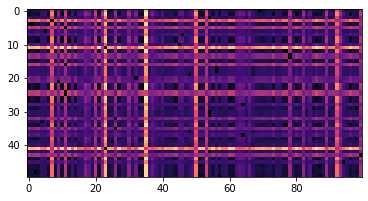

In [4]:
plt.imshow(clust1.distance_matrix[0:50,0:200],cmap="magma")
plt.show()
plt.close()

## Principal component analysis
- use to visualize the quality of the structuring of the data
- symmetric gaussian blobs centered at 0,0 indicate no information
- most informative components exhibit high aspect ratios

Shape of the reduced data (16, 100)


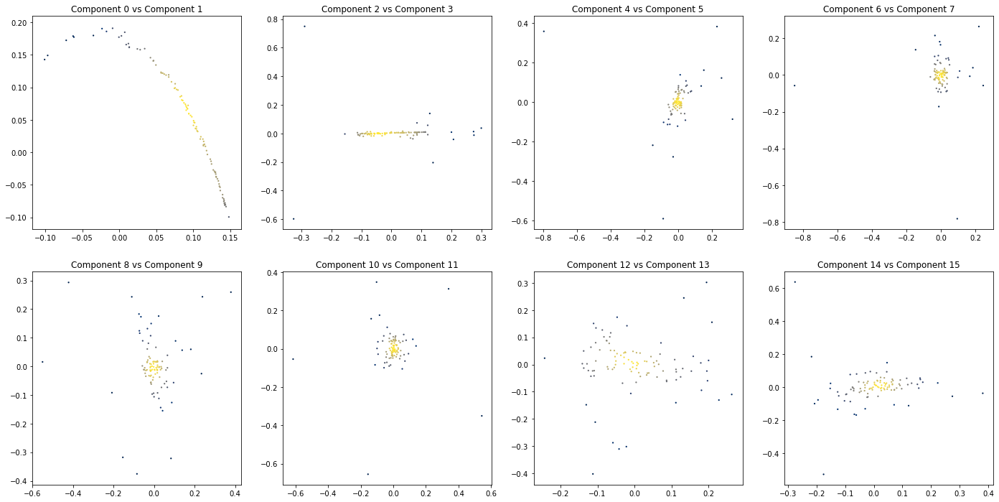

In [5]:
ncomp = int(4 ** 2)
clust1.get_principal_components(ncomp)

## Hierarchical clustering on multi-dimensional data
- TSNE embedding to visualize the quality of the clustering

TSNE embedding has shape: (100, 3)
TSNE embedding has shape: (100, 2)
Identified 23 clusters


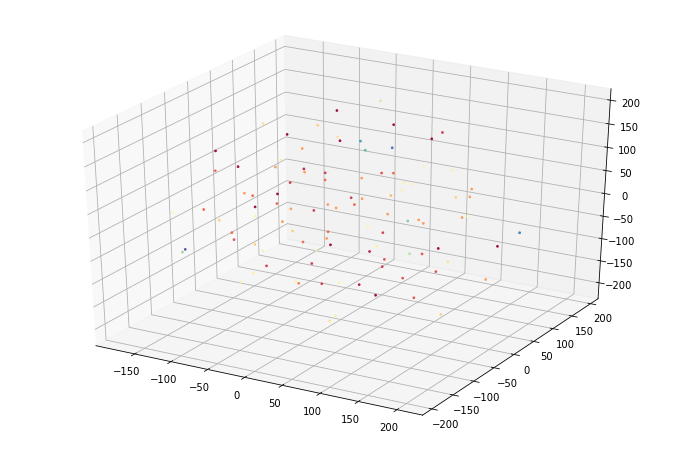

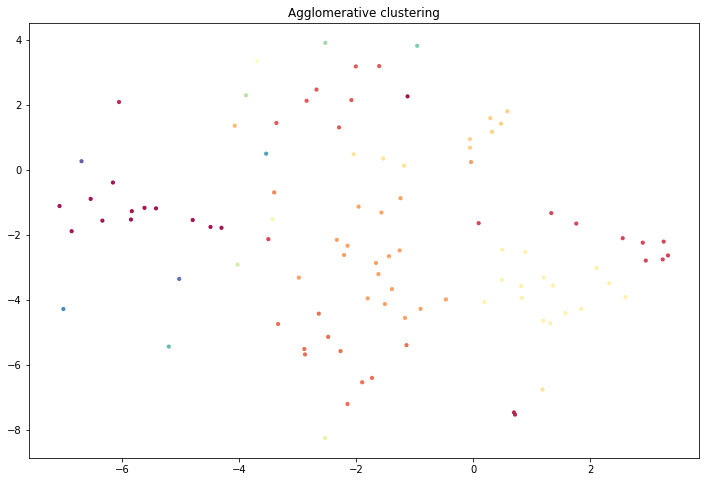

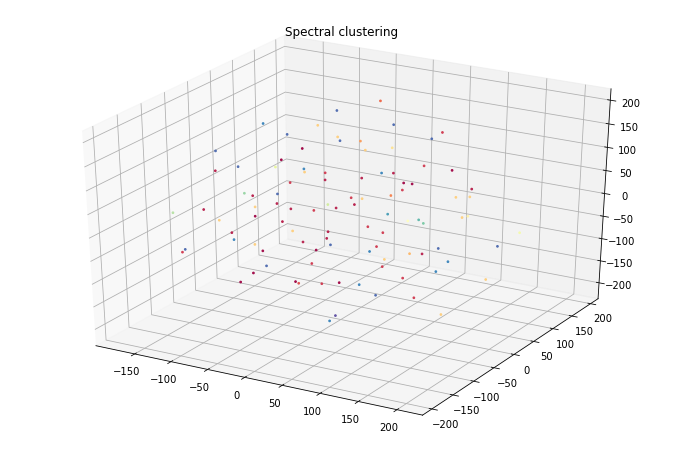

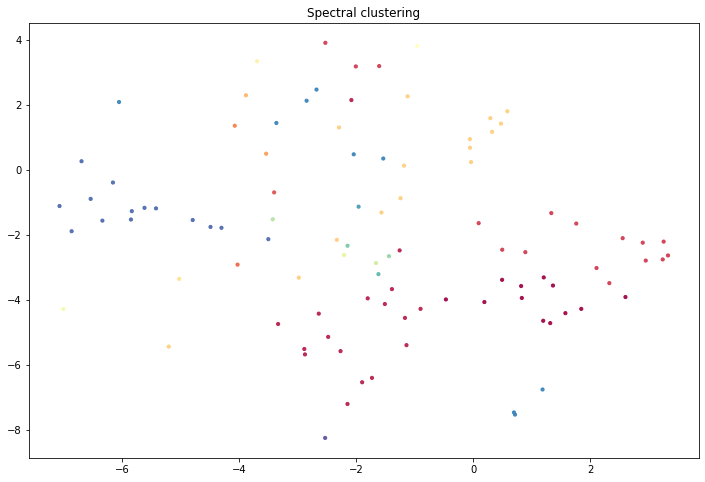

In [6]:
clust1.generate_3d_TSNE()
clust1.generate_2d_TSNE()
clust1.cluster_agglomerative(distance_thresh = cluster_thresh)
clust1.cluster_spectral()

## Collect landmark sequences
- these are members of each cluster
- they become the new dimensional references for 2nd pass clustering
- since they are diversly distributed across the first set of clusters, they provide more information than random sequences

In [7]:
#locate the indices of the landmark reads - create a new set of landmark reads, fill the remaining slots with random ones
landmarks = 0
landmark_indices = np.zeros((dimensions),int)
for i in range(0, clust1.nclusts):
    landmark_indices[i] = int(np.where(clust1.AC.labels_==i)[0][0])
for i in range(clust1.nclusts, dimensions):
    landmark_indices[i] = int(np.random.randint(clust1.nclusts, sample_size, size=1)[0])
landmark_sequences = np.take(clust1.primary_sample, landmark_indices)    

# 3. Second pass clustering
## Restructure data with the new landmark sequences

In [8]:
main_dir = os.getcwd()
clust2 = sq3.Search_Protocol(name = 'multisearch')
clust2.configure_score_matrix()
os.chdir('training_data')
clust2.get_fastq_files()
os.chdir(main_dir)
clust2.get_multiple_reference_sequences()
clust2.initialize_fixed_parameters()
clust2.get_multiple_reference_sequences()
clust2.structure_data(sample_size2, dimensions, landmark_indices)

  0%|          | 4/1000 [00:00<00:30, 32.55it/s]

analysis results will be saved to:  output
number of files to process:  40


100%|██████████| 1000/1000 [00:58<00:00, 17.12it/s]


## second pass principal component analysis
- verify that restructured data has more informative components

Shape of the reduced data (16, 1000)


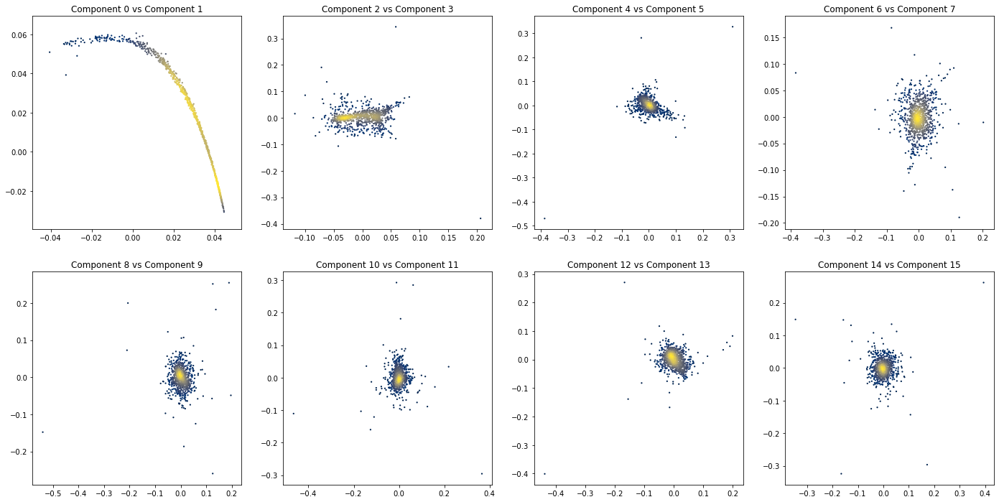

In [9]:
ncomp = int(4 ** 2)
clust2.get_principal_components(ncomp)

## Second pass TSNE and hierarchical clustering

In [10]:
clust2.generate_3d_TSNE()
clust2.generate_2d_TSNE()

TSNE embedding has shape: (1000, 3)
TSNE embedding has shape: (1000, 2)


Identified 28 clusters


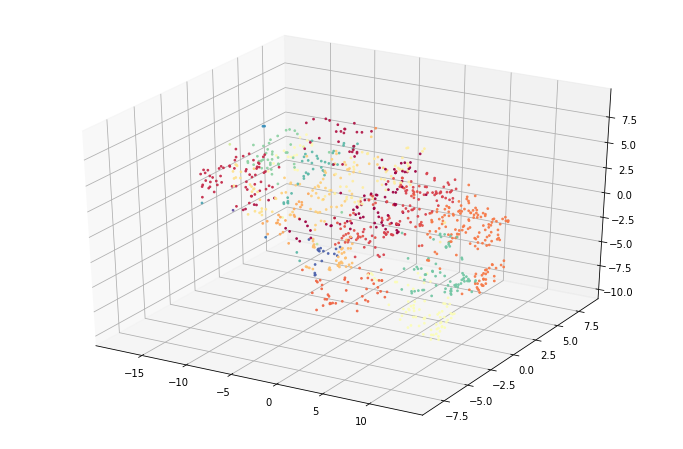

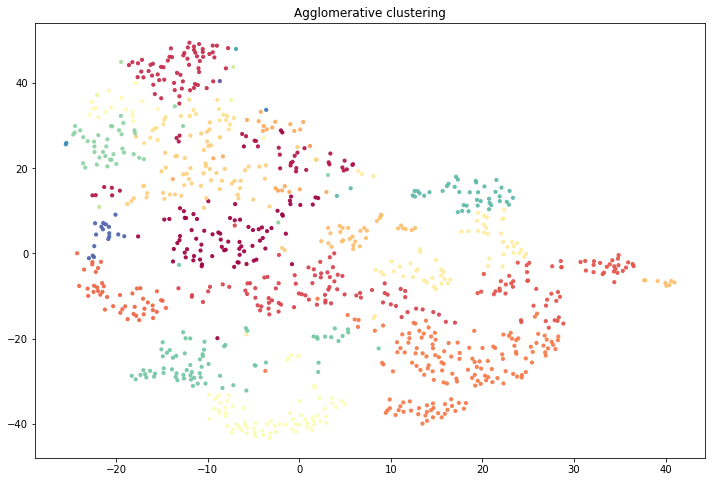

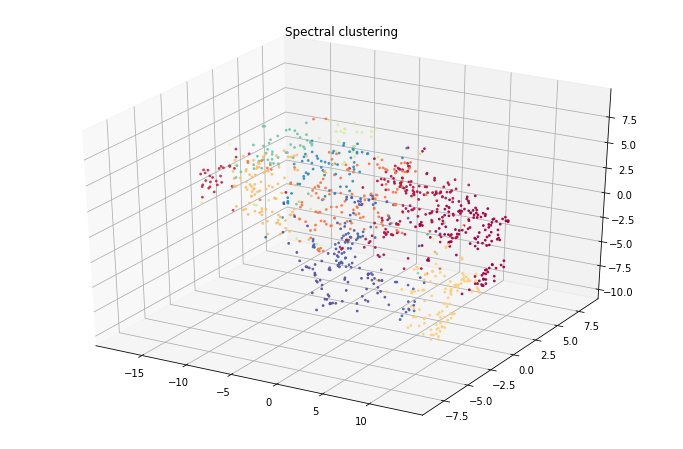

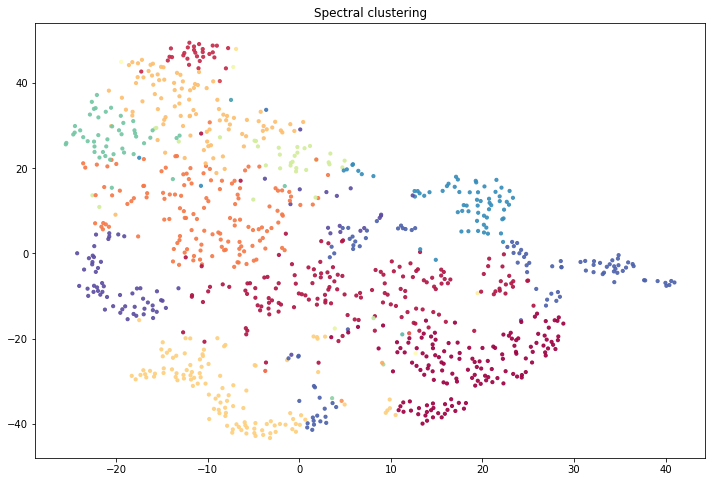

In [11]:
clust2.cluster_agglomerative(distance_thresh = cluster_thresh)
clust2.cluster_spectral()

## The frequencies of each cluster

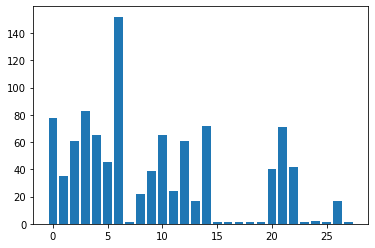

7


In [13]:
(unique, counts) = np.unique(clust2.AC.labels_, return_counts=True)
plt.bar(unique, counts)
plt.show()
plt.close()
# print(unique, counts)
print(np.argmin(counts))

In [14]:
import pickle as pkl
## Save the variables and objects created so far with pickle
pkl.dump([clust1, clust2,  unique, counts, landmarks, landmark_indices, landmark_sequences,sample_size,random_dimensions,cluster_thresh,dimensions,sample_size2,cluster_thresh,mass_sort,msa,muscle_exe,consensus_threshold,mass_harvest,blast_threshold,high_quality_threshold], open('NGS_analysis_clust2.pkl', 'wb'))

In [15]:
import pickle as pkl
## recover them by running the line below
clust1, clust2,  unique, counts, landmarks, landmark_indices, landmark_sequences,sample_size,random_dimensions,cluster_thresh,dimensions,sample_size2,cluster_thresh,mass_sort,msa,muscle_exe,consensus_threshold,mass_harvest,blast_threshold,high_quality_threshold = pkl.load(open('NGS_analysis_clust2.pkl', 'rb'))

# 4. Cluster analysis
- now we go into each cluster and gather information about their composition

In [16]:
### instantiate the sorting object ###
main_dir = os.getcwd()
sortjob1 = sq3.Search_Protocol(name = 'sorting')
sortjob1.configure_score_matrix()
os.chdir('ngs_data')
sortjob1.get_fastq_files()
os.chdir(main_dir)
sortjob1.get_multiple_reference_sequences()
sortjob1.initialize_fixed_parameters(high_quality_threshold)
sortjob1.get_multiple_reference_sequences()
sortjob1.initialize_file_data()

analysis results will be saved to:  output
number of files to process:  314


## sort the clusters into files 
- they will go into the output folder
- format is cluster's number. for example:
    33.fsa
- multiple sequence analysis will be done on each cluster
    - runs MUSCLE for each cluster
    - note that this step takes a long time
    - reduce cluster size to have faster MSA
    - MSA on sets larger than 1000 sequences may take several minutes to hours
- consensus sequences are generated for each cluster
    - saved into the output directory as:
        - __class_consensus_seqs.dna

In [17]:
# sort the primary clusters so that we can do msa on them

for i in range(0, clust2.nclusts):
    if msa == True:
        if os.path.exists(sortjob1.super_directory + "/__class_consensus_seqs.dna"):
            os.remove(sortjob1.super_directory + "/__class_consensus_seqs.dna")
    if os.path.exists(sortjob1.super_directory + "/"+str(i)+".fsa"):
        os.remove(sortjob1.super_directory + "/"+str(i)+".fsa")
for i in tqdm(range(0,clust2.nclusts)):#clust2.nclusts):
    class_size = 0
    for seq_record in np.take(clust2.primary_sample,np.where(clust2.AC.labels_==i))[0]:
        class_size += 1
        sorted_rec = SeqRecord(seq_record.seq,
                                                id=seq_record.id,
                                                name=seq_record.id,
                                                description=f"class: {i}")
        with open(sortjob1.super_directory + "/"+str(i)+".fsa", "a", ) as destination:
            SeqIO.write(sorted_rec, destination, "fasta")
    if msa == True:
        
        infile_name = sortjob1.super_directory + "/"+str(i)+".fsa"
        outfile_name = sortjob1.super_directory + "/"+str(i)+"_muscle.fsa"
        cline = MuscleCommandline(muscle_exe,input=infile_name, out=outfile_name)
        stdout, stderr = cline()
        aln = AlignIO.read(outfile_name, "fasta")
        summary_align = AlignInfo.SummaryInfo(aln)
        consensus = summary_align.dumb_consensus(threshold = consensus_threshold, ambiguous = 'N', consensus_alpha= IUPAC.ambiguous_dna)
        consensus_rec = SeqRecord(consensus,
                                                id=str(uuid.uuid4()),
                                                name=f"consensus_class_{i}",
                                                description=f"The sequence class frequency (number of membersclass divided by sample size): {class_size/sample_size2}")
        with open(sortjob1.super_directory + "/__class_consensus_seqs.dna", "a", ) as destination:
            SeqIO.write(consensus_rec, destination, "stockholm")
        AlignIO.write(aln, sortjob1.super_directory + "/"+str(i)+"_muscle.maf", "maf")

100%|██████████| 28/28 [05:15<00:00, 11.26s/it]


In [18]:
# optional - recompute consensuses - change the agreement threshold here if you want to tweak consensus composition
new_threshold = 0.7
if os.path.exists(sortjob1.super_directory + "/__class_consensus_seqs.dna"):
    os.remove(sortjob1.super_directory + "/__class_consensus_seqs.dna")
for i in tqdm(range(0,clust2.nclusts)):#clust2.nclusts):
        if msa == True:
            outfile_name = sortjob1.super_directory + "/"+str(i)+"_muscle.fsa"
            aln = AlignIO.read(outfile_name, "fasta")
            summary_align = AlignInfo.SummaryInfo(aln)
            consensus = summary_align.dumb_consensus(threshold = new_threshold, ambiguous = 'N', consensus_alpha= IUPAC.ambiguous_dna)
            consensus_rec = SeqRecord(consensus,
                                                    id=str(uuid.uuid4()),
                                                    name=f"consensus_class_{i}",
                                                    description=f"The sequence class frequency (number of membersclass divided by sample size): {class_size/sample_size2}")
            with open(sortjob1.super_directory + "/__class_consensus_seqs.dna", "a", ) as destination:
                SeqIO.write(consensus_rec, destination, "stockholm")
            AlignIO.write(aln, sortjob1.super_directory + "/"+str(i)+"_muscle.maf", "maf")

100%|██████████| 28/28 [00:01<00:00, 24.52it/s]


## characterize the consensus sequences with references using pairwise local alignment
- Smith Waterman algorithm
- takes appx 15 minutes for 10 references and 100 clusters

In [19]:
# characterize consensus alignment with references
consensuses = [i for i in SeqIO.parse(sortjob1.super_directory + "/__class_consensus_seqs.dna", "stockholm")]
consensus_scores = np.zeros((len(consensuses),len(sortjob1.reference_sequences)))
for i in tqdm(range(0, len(consensuses))):
    for j in range(0, len(sortjob1.reference_sequences)):
        cons_ref_aln = sq3.Alignment(sortjob1)
        cons_ref_aln.initialize_reference_threshold(sortjob1.reference_sequences[j])
        cons_ref_aln.align_read_to_ref(consensuses[i], sortjob1.reference_sequences[j].seq)
        consensus_scores[i,j] = cons_ref_aln.oriented_reference_alignment[2]

100%|██████████| 28/28 [02:58<00:00,  6.39s/it]


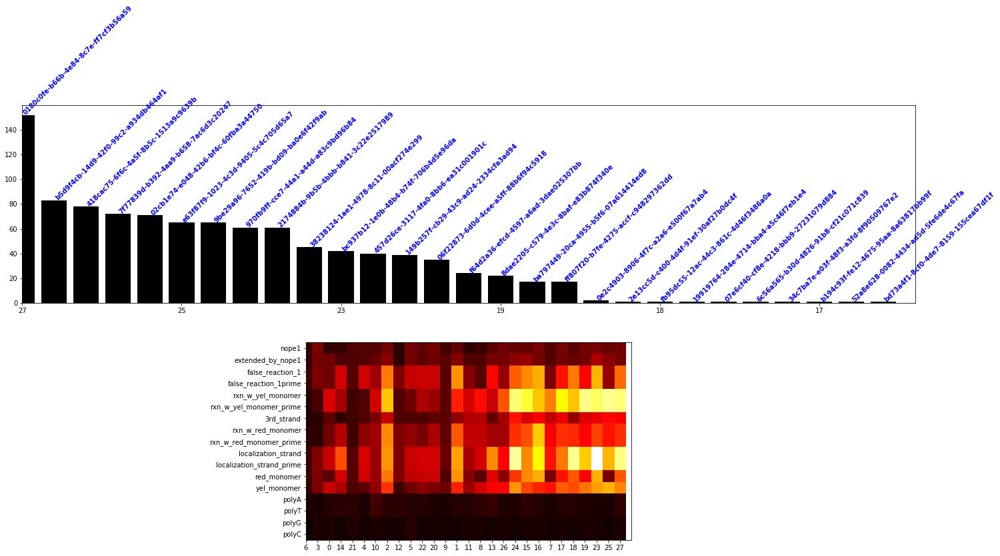

In [20]:
fig = plt.figure(figsize=(24,12))
plt.rcParams.update({'font.size': 10})

score_mat = consensus_scores.T

# sort groups
arr1inds = counts.argsort()
sorted_arr1 = counts[arr1inds[:]]
sorted_arr2 = unique[arr1inds[:]]



ax1 = fig.add_subplot(212)
ax1.set_yticks(np.arange(0,len(sortjob1.reference_sequences)))
ax1.imshow(score_mat[:,arr1inds[::-1]], cmap="hot")
ax1.set_yticklabels([x.id for x in sortjob1.reference_sequences],rotation=0)
ax1.set_xlim(0,len(unique))
ax1.set_xticks(range(0, len(unique))[::-1])
ax1.set_xticklabels(unique[arr1inds[:]],rotation=0)
ax2 = fig.add_subplot(211)

for i, v in enumerate(counts[arr1inds[::-1]]):
    ax2.text(i, v, np.array([str(cons.id) for cons in consensuses])[arr1inds][i], color='blue', fontweight='bold',rotation=45)
ax2.bar(unique, counts[arr1inds[::-1]], color= "k")
ax2.set_xlim(0,len(unique))
# ax2.set_xticks(range(0, len(unique))[::-1])
ax2.set_xticklabels(unique[arr1inds[:]],rotation=0)
# ax2.set_xticklabels(np.array([str(cons.seq) for cons in consensuses])[arr1inds],rotation=1)
plt.savefig("consensus_scores_references.svg")



## visualize an individual cluster's multiple sequence alignment
- you can also look at the saved alignment files in the output directory, for example:
    - 33_muscle.maf

In [21]:
pn.extension()
aln = AlignIO.read('output/0_muscle.fsa','fasta')
p = sq3.view_alignment(aln, plot_width=900)
pn.pane.Bokeh(p)

Bokeh(Column)

## (optional) mass-scale sorting 
### generate a Voronoi tessellation from the cluster centers
- measure the Levenshtein distances of new sequences (i.e. those not sampled in the first or second pass clustering)
- place them in multidimensional space
- their coordinate in multidimensional space will fall into a Voronoi cell determined by their closest distance to one of the cluster center points
- this way we can sort the rest of the sample without performing additional computationally-expensive clustering
- use this step to clean up or reduce your sample to richer data
- sorted files will be saved in the output directory for example as:
    - 33full.fsa

In [22]:
# fetch the voronoi centers of each of the discovered clusters
voronoi_centers = {}
for i in range(0, clust2.nclusts):
    data_frame = np.take(clust2.distance_matrix,np.where(clust2.AC.labels_==i),axis=1)
    voronoi_centers[i] =  np.mean(data_frame.T,axis=0)[0]

In [23]:
### mass sort data with voronoi tessellation - euclidean distance ####
if mass_sort == True:
    for i in range(0, clust2.nclusts):
        if os.path.exists(sortjob1.super_directory + "/"+str(i)+"full.fsa"):
            os.remove(sortjob1.super_directory + "/"+str(i)+"full.fsa")
    for file in tqdm(sortjob1.file_list):
        for seq_record in SeqIO.parse(file, "fastq"):
                data_array = sortjob1.structure_data_single(seq_record, dimensions,landmark_sequences)
                sorted_class = np.argmin([euclidean(voronoi_centers[clust], data_array) for clust in range(0, clust2.nclusts)])
                sorted_rec = SeqRecord(seq_record.seq,
                                                id=seq_record.id,
                                                name=seq_record.id,
                                                description=f"class: {sorted_class}")
                with open(sortjob1.super_directory + "/"+str(sorted_class)+"full.fsa", "a", ) as destination:
                    SeqIO.write(sorted_rec, destination, "fasta")      

In [24]:
import pickle as pkl
## Save the variables and objects created so far with pickle
pkl.dump([sortjob1,voronoi_centers,consensus_scores,consensuses], open('NGS_analysis_sortjob1.pkl', 'wb'))

In [25]:
import pickle as pkl
## recover them by running the line below
clust1, clust2,  unique, counts, landmarks, landmark_indices, landmark_sequences,sample_size,random_dimensions,cluster_thresh,dimensions,sample_size2,cluster_thresh,mass_sort,msa,muscle_exe,consensus_threshold,mass_harvest,blast_threshold,high_quality_threshold = pkl.load(open('NGS_analysis_clust2.pkl', 'rb'))
sortjob1,voronoi_centers,consensus_scores,consensuses = pkl.load(open('NGS_analysis_sortjob1.pkl', 'rb'))

# 5. COARSE HARVESTING - (unrealted to clustering)
## use BLAST to quickly harvest sequences with decent agreement with references
- choose target sequences to harvest with the file:
    - references_to_harvest.fsa

In [26]:
### COARSE MASS HARVEST TARGET REFERENCES WITH BLAST ###
if mass_harvest == True:
    targets = []
    with open("references_to_harvest.fsa", "r", ) as file:
        for seq_record in SeqIO.parse(file, "fasta"):
            targets.append(seq_record)
    for tar in range(0, len(targets)):
        query = str(targets[tar].seq)
        print(targets[tar].id)
        if os.path.exists(sortjob1.super_directory + "/"+str(targets[tar].id)+".fsa"):
            os.remove(sortjob1.super_directory + "/"+str(targets[tar].id)+".fsa")
        for file in tqdm(sortjob1.file_list):
            db = [str(x.seq) for x in SeqIO.parse(file, "fastq")]
            db_ids = [str(x.id) for x in SeqIO.parse(file, "fastq")]
            result = sq3.threshold_alignments(db, db_ids, query,threshold = blast_threshold, w=3)
            if result:
                with open(sortjob1.super_directory + "/"+str(targets[tar].id)+".fsa", "a", ) as destination:
                    SeqIO.write(result, destination, "fasta")

  0%|          | 0/314 [00:00<?, ?it/s]

rxn_w_yel_monomer


  0%|          | 0/314 [00:00<?, ?it/s]

rxn_w_red_monomer_prime


  0%|          | 0/314 [00:00<?, ?it/s]

rxn_w_red_monomer


 25%|██▍       | 78/314 [01:31<04:37,  1.18s/it]


KeyboardInterrupt: 

In [ ]:
import pickle as pkl
## recover them by running the line below
clust1, clust2,  unique, counts, landmarks, landmark_indices, landmark_sequences,sample_size,random_dimensions,cluster_thresh,dimensions,sample_size2,cluster_thresh,mass_sort,msa,muscle_exe,consensus_threshold,mass_harvest,blast_threshold,high_quality_threshold = pkl.load(open('NGS_analysis_clust2.pkl', 'rb'))
sortjob1,voronoi_centers,consensus_scores,consensuses = pkl.load(open('NGS_analysis_sortjob1.pkl', 'rb'))

# 6. Fine harvest - local alignment 
- go through the BLAST coarse-harvested files
- perform Smith-Waterman alignment on each 
- generate histograms of the score distribution in each harvest-file
    - look for things like bimodality - indicates sample with 

In [ ]:
### now go through the resulting harvest with smith waterman alignment, generate score histograms, and alignment files
import importlib
importlib.reload(sq3)

if mass_harvest == True:
    targets = []
    with open("references_to_harvest.fsa", "r", ) as file:
        for seq_record in SeqIO.parse(file, "fasta"):
            targets.append(seq_record)
    for tar in range(0, len(targets)): # go into each of the blast-harvest files by target
        query = targets[tar]
        scores = []
        print(targets[tar].id)
        if os.path.exists(sortjob1.super_directory + "/"+str(targets[tar].id)+"HQalignments.fsa"):
            os.remove(sortjob1.super_directory + "/"+str(targets[tar].id)+"HQalignments.fsa")
        counter = 0
        with open(sortjob1.super_directory + "/"+str(targets[tar].id)+".fsa", "r", ) as file:
            for seq_record in tqdm(SeqIO.parse(file, "fasta")):
                aln = sq3.Alignment(sortjob1)
                aln.initialize_reference_threshold(query)
                aln.align_read_to_ref_unisense(seq_record, query.seq)
                scores.append(aln.oriented_reference_alignment[2]/aln.max_score)
                if aln.check_reference_alignment():
                    record = SeqRecord(seq_record.seq,
                                        id=seq_record.id,
                                        name=seq_record.id,
                                        description=" Fractional score: "+ str(aln.oriented_reference_alignment[2]/aln.max_score) +" Score: "+ str(aln.oriented_reference_alignment[2]) + " Threshold: " + str(aln.reference_score_threshold) + ". Reference "+str(aln.reference_id)+" aligns with read positions " + str(aln.oriented_reference_alignment[3]) + " - " +str(aln.oriented_reference_alignment[4]))
                    with open(sortjob1.super_directory + "/"+str(targets[tar].id)+"HQalignments.fsa", "a", ) as destination:
                        destination.write(str(record.id) + str(record.description) + "\n%s\n" % str(format_alignment(*aln.oriented_reference_alignment, full_sequences=True)))
                if counter % 1000 == 0:
                    fig, ax = plt.subplots()
                    n, bins, patches = ax.hist(scores, 100, density=1, color = "k")
                    ax.set_xlabel('Alignment Score (fractional)')
                    ax.set_ylabel('Frequency')
                    fig.savefig("score_histogram"+str(targets[tar].id)+".svg")
                    plt.show()
                    plt.close()
                    
                counter += 1
        fig.close()                
        fig, ax = plt.subplots()
        n, bins, patches = ax.hist(scores, 100, density=1, color = "k")
        ax.set_xlabel('Alignment Score (fractional)')
        ax.set_ylabel('Frequency')
        fig.savefig("score_histogram"+str(targets[tar].id)+".svg")
        plt.show()
        plt.close()